In [1]:
import pandas as pd
import numpy as np
import json
print('Hello Capstone Project Course')

Hello Capstone Project Course


In [2]:
import requests
import bs4
print("Modules imported")

Modules imported


### Getting House Sales Data

In [3]:
hs = pd.read_csv('properties.csv')
hs.head()

,Unnamed: 0,Address,AreaName,Price ($),lat,lng
0,0,"86 Waterford Dr Toronto, ON",Richview,999888,43.679882,-79.544266
1,1,"#80 - 100 BEDDOE DR Hamilton, ON",Chedoke Park B,399900,43.250000,-79.904396
2,2,"213 Bowman Street Hamilton, ON",Ainslie Wood East,479000,43.251690,-79.919357
3,3,"102 NEIL Avenue Hamilton, ON",Greenford,285900,43.227161,-79.767403
4,6,"#1409 - 230 King St Toronto, ON",Downtown,362000,43.651478,-79.368118


In [4]:
hs.drop(hs.columns[0], axis=1, inplace=True)
hs.head(3)

,Address,AreaName,Price ($),lat,lng
0,"86 Waterford Dr Toronto, ON",Richview,999888,43.679882,-79.544266
1,"#80 - 100 BEDDOE DR Hamilton, ON",Chedoke Park B,399900,43.250000,-79.904396
2,"213 Bowman Street Hamilton, ON",Ainslie Wood East,479000,43.251690,-79.919357


In [5]:
hs.shape

(25351, 5)

Counting the number of missing values in the dataset

In [6]:
hs.isnull().sum()

Address        0
AreaName     483
Price ($)      0
lat            0
lng            0
dtype: int64

483 rows are missing AreaName. <br>
This is just 1.9% of the entire dataset. <br>
We will remove these rows

In [7]:
hs.dropna(inplace = True)
hs.shape

(24868, 5)

In [8]:
hs.head()

,Address,AreaName,Price ($),lat,lng
0,"86 Waterford Dr Toronto, ON",Richview,999888,43.679882,-79.544266
1,"#80 - 100 BEDDOE DR Hamilton, ON",Chedoke Park B,399900,43.250000,-79.904396
2,"213 Bowman Street Hamilton, ON",Ainslie Wood East,479000,43.251690,-79.919357
3,"102 NEIL Avenue Hamilton, ON",Greenford,285900,43.227161,-79.767403
4,"#1409 - 230 King St Toronto, ON",Downtown,362000,43.651478,-79.368118


Remove all entries outside Toronto

In [9]:
hs = hs[hs['Address'].str.contains('Toronto')]
hs.head(4)

,Address,AreaName,Price ($),lat,lng
0,"86 Waterford Dr Toronto, ON",Richview,999888,43.679882,-79.544266
4,"#1409 - 230 King St Toronto, ON",Downtown,362000,43.651478,-79.368118
5,"254A Monarch Park Ave Toronto, ON",Old East York,1488000,43.686375,-79.328918
6,"532 Caledonia Rd Toronto, ON",Fairbank,25,43.691193,-79.461662


In [10]:
hs.shape

(5092, 5)

### Getting Foursquare Venues Data

1. Get Canada M Postal Codes

In [11]:
res = requests.get('https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M')
# empty list 
data = [] 
   
# getting the header from 
# the HTML file 
list_header = [] 
soup = bs4.BeautifulSoup(res.text, 'html.parser')
header = soup.find_all("table")[0].find("tr") 
  
for items in header: 
    try: 
        list_header.append(items.get_text().strip()) 
    except: 
        pass
  

HTML_data = soup.find_all("table")[0].find_all("tr")[1:] 
  
for element in HTML_data: 
    sub_data = [] 
    for sub_element in element: 
        try: 
            sub_data.append(sub_element.get_text().strip()) 
        except: 
            continue
    data.append(sub_data) 
  
# Storing the data into Pandas 
# DataFrame  
pc = pd.DataFrame(data = data, columns = list_header) 

In [12]:
pc.head()

,Postal Code,Borough,Neighborhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


In [13]:
pc.shape

(180, 3)

Count the number of rows with no assigned neighborhood

In [14]:
pc[pc['Neighborhood'] == 'Not assigned'].count()

Postal Code     77
Borough         77
Neighborhood    77
dtype: int64

77 rows have no assigned neighborhood

Drop the rows with not assigned neighborhood

In [15]:
pc.drop(pc[pc['Borough'] == 'Not assigned'].index, inplace = True)
pc = pc.reset_index(drop=True)
pc.head()

,Postal Code,Borough,Neighborhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"


#### Now, finding coordinates of each neighborhood

In [16]:
!pip install pgeocode

In [17]:
import pgeocode

In [18]:
nomi = pgeocode.Nominatim('CA')

lat = []
lng = []

for pcx in pc['Postal Code']:
    
    lat.append(nomi.query_postal_code(pcx)['latitude'])
    lng.append(nomi.query_postal_code(pcx)['longitude'])

pc['latitude'] = lat
pc['longitude'] = lng

In [19]:
pc.head()

,Postal Code,Borough,Neighborhood,latitude,longitude
0,M3A,North York,Parkwoods,43.7545,-79.3300
1,M4A,North York,Victoria Village,43.7276,-79.3148
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.6555,-79.3626
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.7223,-79.4504
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.6641,-79.3889


In [20]:
toronto = pd.DataFrame(columns = pc.columns)

for i in range(len(pc)):
    
    if 'Toronto' in pc.loc[i, 'Borough']:
        
        toronto = toronto.append(pc.loc[i])

In [21]:
print(toronto.shape)

(39, 5)


#### Get the venues data from Foursquare

In [22]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
#from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

from geopy.geocoders import Nominatim

print('Libraries imported.')

Libraries imported.


In [23]:
#Foursquare Credentials
CLIENT_ID = 'KK4QVCASJEMLYDSOCWLFNQ2TNWV05UBKVQ13ZDTLYRCLZN4S' # your Foursquare ID
CLIENT_SECRET = 'B0SSXAF0H4LRYEIY43BRR00MKYNNPJCTNXNLX4XYLTYCCFVA' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 500 # define radius

Your credentails:
CLIENT_ID: KK4QVCASJEMLYDSOCWLFNQ2TNWV05UBKVQ13ZDTLYRCLZN4S
CLIENT_SECRET:B0SSXAF0H4LRYEIY43BRR00MKYNNPJCTNXNLX4XYLTYCCFVA


In [24]:
# Let's get the info from the item key
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [25]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
            
        except:
            pass

        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']

    
    return(nearby_venues)

In [26]:
#Now, we run the fucntion for all the neighborhoods
toronto_venues = getNearbyVenues(names=toronto['Neighborhood'],
                                   latitudes=toronto['latitude'],
                                   longitudes=toronto['longitude'])

Regent Park, Harbourfront
Queen's Park, Ontario Provincial Government
Garden District, Ryerson
St. James Town
The Beaches
Berczy Park
Central Bay Street
Christie
Richmond, Adelaide, King
Dufferin, Dovercourt Village
Harbourfront East, Union Station, Toronto Islands
Little Portugal, Trinity
The Danforth West, Riverdale
Toronto Dominion Centre, Design Exchange
Brockton, Parkdale Village, Exhibition Place
India Bazaar, The Beaches West
Commerce Court, Victoria Hotel
Studio District
Lawrence Park
Roselawn
Davisville North
Forest Hill North & West, Forest Hill Road Park
High Park, The Junction South
North Toronto West,  Lawrence Park
The Annex, North Midtown, Yorkville
Parkdale, Roncesvalles
Davisville
University of Toronto, Harbord
Runnymede, Swansea
Moore Park, Summerhill East
Kensington Market, Chinatown, Grange Park
Summerhill West, Rathnelly, South Hill, Forest Hill SE, Deer Park
CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport


In [27]:
#### Let's check the resulting dataframe
print(toronto_venues.shape)
toronto_venues.head()

(1535, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Regent Park, Harbourfront",43.6555,-79.3626,Roselle Desserts,43.653447,-79.362017,Bakery
1,"Regent Park, Harbourfront",43.6555,-79.3626,Tandem Coffee,43.653559,-79.361809,Coffee Shop
2,"Regent Park, Harbourfront",43.6555,-79.3626,Figs Breakfast & Lunch,43.655675,-79.364503,Breakfast Spot
3,"Regent Park, Harbourfront",43.6555,-79.3626,The Yoga Lounge,43.655515,-79.364955,Yoga Studio
4,"Regent Park, Harbourfront",43.6555,-79.3626,Body Blitz Spa East,43.654735,-79.359874,Spa


The number of venues returned

In [28]:
toronto_venues.groupby('Venue Category').count()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude
Venue Category,,,,,,
Accessories Store,1,1,1,1,1,1
American Restaurant,24,24,24,24,24,24
Art Gallery,13,13,13,13,13,13
Art Museum,1,1,1,1,1,1
Arts & Crafts Store,4,4,4,4,4,4
Asian Restaurant,14,14,14,14,14,14
Athletics & Sports,1,1,1,1,1,1
BBQ Joint,4,4,4,4,4,4
Baby Store,1,1,1,1,1,1


How many entries are missing values?

In [29]:
toronto_venues.isnull().sum()

Neighborhood              0
Neighborhood Latitude     0
Neighborhood Longitude    0
Venue                     0
Venue Latitude            0
Venue Longitude           0
Venue Category            0
dtype: int64

## Exploratory Analysis

In [30]:
hs.head()

,Address,AreaName,Price ($),lat,lng
0,"86 Waterford Dr Toronto, ON",Richview,999888,43.679882,-79.544266
4,"#1409 - 230 King St Toronto, ON",Downtown,362000,43.651478,-79.368118
5,"254A Monarch Park Ave Toronto, ON",Old East York,1488000,43.686375,-79.328918
6,"532 Caledonia Rd Toronto, ON",Fairbank,25,43.691193,-79.461662
11,"47 Armstrong Ave Toronto, ON",Wallace Emerson,113,43.664101,-79.439751


In [31]:
toronto_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Regent Park, Harbourfront",43.6555,-79.3626,Roselle Desserts,43.653447,-79.362017,Bakery
1,"Regent Park, Harbourfront",43.6555,-79.3626,Tandem Coffee,43.653559,-79.361809,Coffee Shop
2,"Regent Park, Harbourfront",43.6555,-79.3626,Figs Breakfast & Lunch,43.655675,-79.364503,Breakfast Spot
3,"Regent Park, Harbourfront",43.6555,-79.3626,The Yoga Lounge,43.655515,-79.364955,Yoga Studio
4,"Regent Park, Harbourfront",43.6555,-79.3626,Body Blitz Spa East,43.654735,-79.359874,Spa


Visualizing the neighborhoods in Toronto

In [32]:
geolocator = Nominatim(user_agent="ca_explorer")
location = geolocator.geocode("Toronto")
latitude = location.latitude
longitude = location.longitude
print('The latitude and longitude of Toronto are (' + str(latitude) +' , ' + str(longitude) +' )')

The latitude and longitude of Toronto are (43.6534817 , -79.3839347 )


In [33]:
# create map of Manhattan using latitude and longitude values
toronto_map = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(toronto['latitude'], toronto['longitude'], toronto['Neighborhood']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(toronto_map) 
toronto_map

Observation: <br>
1. One neighborhood is very far away from the rest
2. The Concentration increases as you go to the Union Station (near the coast) from any direction on the mainland.
3. The largest concentration is near the Toronto Union Station

In [34]:
hs.describe()

,Price ($),lat,lng
count,5.092000e+03,5092.000000,5092.000000
mean,7.499997e+05,43.709791,-79.392380
std,1.121114e+06,0.061736,0.110521
min,0.000000e+00,43.587688,-80.842804
25%,3.250000e+05,43.653177,-79.452715
50%,4.750000e+05,43.704050,-79.394135
75%,7.498880e+05,43.765161,-79.337746
max,2.680000e+07,44.232288,-76.504181


In [35]:
# create map of Manhattan using lat and lng values
hs_map = folium.Map(location=[lat, lng], zoom_start=11)

# add markers to map
for lat, lng, label, price in zip(hs['lat'], hs['lng'], hs['AreaName'], hs['Price ($)']):
    label = folium.Popup(label, parse_html=True)
    if (price < 3.25e5):
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='green',
            fill=True,
            #fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(hs_map)
    
    elif (3.25e5 < price < 7.50e5 ):
        
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='blue',
            fill=True,
            #fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(hs_map)
        
    else:
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            popup=label,
            color='red',
            fill=True,
            #fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(hs_map)
    
hs_map

In [36]:
hs_map.save('map1.png')

In [37]:
hs_map
toronto_map

In [38]:
categories = toronto_venues['Venue Category'].unique()

In [39]:
# N = 100
# Min_lat = hs['lat'].min()
# Max_lat = hs['lat'].max()
# Min_lng = hs['lng'].min()
# Max_lng = hs['lng'].max()
# dlat = (Max_lat - Min_lat)/N
# dlng = (Max_lng - Min_lng)/N

In [40]:
dlat = 0.015
dlng = 0.025

In [41]:
hs.head()

,Address,AreaName,Price ($),lat,lng
0,"86 Waterford Dr Toronto, ON",Richview,999888,43.679882,-79.544266
4,"#1409 - 230 King St Toronto, ON",Downtown,362000,43.651478,-79.368118
5,"254A Monarch Park Ave Toronto, ON",Old East York,1488000,43.686375,-79.328918
6,"532 Caledonia Rd Toronto, ON",Fairbank,25,43.691193,-79.461662
11,"47 Armstrong Ave Toronto, ON",Wallace Emerson,113,43.664101,-79.439751


In [42]:
tv = toronto_venues

In [43]:
ilat = 3
ilng = 4

In [82]:
ct = {}

for c in categories:
    
    ct[c] = []

In [83]:
len(ct['Bakery'])

0

In [84]:
len(hs)

5092

In [42]:
from IPython.display import clear_output

In [54]:
for i in range(len(hs)):
    
    lat = hs.iloc[i][ilat]
    lng = hs.iloc[i][ilng]
    
    tmp = tv[(tv['Venue Latitude'] > lat -dlat/2) & (tv['Venue Latitude'] < lat + dlat/2)]
    
    tmp = tmp[(tmp['Venue Longitude'] > lng - dlng/2) & (tmp['Venue Longitude'] < lng + dlng/2)]
    
    for c in categories:
        
        ct[c].append(tmp[tmp['Venue Category'] == c].count().max())
    
    
    clear_output(wait=True)
    print((i/len(hs))*100, '%')    

99.98036135113905 %


In [55]:
for j in ct:
    
    hs[j] = ct[j]

In [58]:
hs.to_csv('hs_with_neighborhood.csv')

In [44]:
hs = pd.read_csv('hs_with_neighborhood.csv')
hs.drop(['Address','Unnamed: 0'] , axis=1, inplace=True)

In [45]:
hs.head()

,AreaName,Price ($),lat,lng,Bakery,Coffee Shop,Breakfast Spot,Yoga Studio,Pub,Spa,Thai Restaurant,Event Space,Restaurant,Italian Restaurant,Distribution Center,Gym / Fitness Center,Food Truck,Theater,Electronics Store,Beer Store,Health Food Store,Dance Studio,Park,Sushi Restaurant,Beer Bar,Bubble Tea Shop,Mexican Restaurant,Creperie,Diner,Ramen Restaurant,General Entertainment,Arts & Crafts Store,Burrito Place,Hobby Shop,Café,Martial Arts Dojo,Indian Restaurant,College Theater,Poke Place,Deli / Bodega,Gym,College Cafeteria,Vegetarian / Vegan Restaurant,Music Venue,Tea Room,Clothing Store,Comic Shop,Plaza,Pizza Place,College Rec Center,Sandwich Place,Hotel,Sporting Goods Shop,Art Gallery,Steakhouse,Japanese Restaurant,Shopping Mall,Burger Joint,Tanning Salon,Fast Food Restaurant,Lounge,Middle Eastern Restaurant,Cosmetics Shop,Lake,Bookstore,Modern European Restaurant,Miscellaneous Shop,Gastropub,New American Restaurant,Ethiopian Restaurant,Furniture / Home Store,Bank,Seafood Restaurant,Poutine Place,Chinese Restaurant,Other Great Outdoors,Hookah Bar,Bar,Dessert Shop,Department Store,Lingerie Store,Movie Theater,Shoe Store,Smoke Shop,Vietnamese Restaurant,Wine Bar,Video Game Store,Greek Restaurant,Church,American Restaurant,BBQ Joint,Ice Cream Shop,Cocktail Bar,Farmers Market,Fountain,Camera Store,Tailor Shop,Grocery Store,French Restaurant,Fish Market,Comfort Food Restaurant,Salon / Barbershop,Irish Pub,Asian Restaurant,Bistro,Pharmacy,Moroccan Restaurant,Belgian Restaurant,Trail,Neighborhood,Cheese Shop,Museum,Concert Hall,Basketball Stadium,Liquor Store,Jazz Club,Molecular Gastronomy Restaurant,Gourmet Shop,Bagel Shop,Hotel Bar,Eastern European Restaurant,Juice Bar,Sports Bar,Soup Place,Art Museum,Discount Store,Donut Shop,Playground,Candy Store,Baby Store,Speakeasy,Gluten-free Restaurant,General Travel,Opera House,Food Court,Monument / Landmark,Salad Place,Colombian Restaurant,Mediterranean Restaurant,Garden,Taco Place,Brazilian Restaurant,Building,Women's Store,Latin American Restaurant,Bus Line,Athletics & Sports,Harbor / Marina,Brewery,Korean Restaurant,Cuban Restaurant,Record Shop,Malay Restaurant,Cupcake Shop,Mac & Cheese Joint,Men's Store,Dog Run,Gift Shop,Music Store,Fruit & Vegetable Store,Train Station,IT Services,Roof Deck,Supermarket,Hawaiian Restaurant,Pet Store,Thrift / Vintage Store,Beach Bar,Chiropractor,Accessories Store,Boutique,Fish & Chips Shop,Board Shop,Food & Drink Shop,Coworking Space,Baseball Field,Performing Arts Venue,Garden Center,Photography Studio,Home Service,Bed & Breakfast,Residential Building (Apartment / Condo),Gym Pool,History Museum,Butcher,Flower Shop,Curling Ice,Optical Shop,Toy / Game Store,Gas Station,Tennis Court,College Gym,College Arts Building,Noodle House,Falafel Restaurant,Smoothie Shop,Indie Movie Theater,Post Office,Pilates Studio,Organic Grocery,Caribbean Restaurant,Gaming Cafe,Doner Restaurant,Light Rail Station,Market,Historic Site,Wings Joint,Fried Chicken Joint,Whisky Bar,Jewelry Store,Taiwanese Restaurant,Library,Convenience Store,Snack Place,Office,Theme Restaurant,Wine Shop,Gay Bar,Sake Bar,Afghan Restaurant,Strip Club,Sculpture Garden
0,Richview,999888,43.679882,-79.544266,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Downtown,362000,43.651478,-79.368118,9,38,8,2,10,1,3,1,9,4,1,1,3,4,1,1,1,0,2,1,7,0,0,3,4,1,1,0,2,0,29,0,0,0,1,6,11,0,2,1,6,6,0,2,2,1,6,14,2,9,0,11,3,0,2,1,1,5,5,1,3,0,0,8,4,1,4,1,10,1,1,1,1,2,0,6,2,1,2,1,2,5,2,1,1,8,2,5,6,2,2,1,3,2,4,2,2,0,4,0,1,2,2,1,0,0,2,5,2,0,0,1,1,1,1,0,1,1,0,2,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [46]:
#hs.drop(['Address'], axis = 1, inplace = True)

In [47]:
#hs.head()

Let's add up all the categories

In [48]:
total = hs[categories[0]]

In [49]:
total = hs[categories[0]]
tmp = []
for i in range(1, len(categories)):
    
    c = categories[i]
    try:
        #tmp.append(hs[c])
        total += hs[c]
    except:
        print(c)
    
#tmp = np.array(tmp)

Kitchen Supply Store
Skating Rink
Intersection
Lawyer
Scenic Lookout
Supplement Shop
Knitting Store
Outdoor Sculpture


In [50]:
hs['Total Number of Venues'] = total

Let's plot the price against the number of venues

In [51]:
#!pip install seaborn
import seaborn as sns
sns.set(color_codes=True)

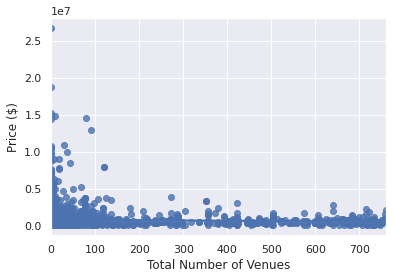

In [52]:
p = sns.regplot('Total Number of Venues', 'Price ($)', data=hs)
p.figure.savefig('hp.png')

We will bin these data

In [53]:
import math

In [54]:
pbins = pd.cut(hs['Total Number of Venues'], 10000, retbins=True)

In [55]:
bins = np.unique(pbins[0])

In [56]:
df = pd.DataFrame(columns = ['Number of Venues','Price'])
for interval in bins:

    u = hs[(hs['Total Number of Venues'] > interval.left) & (hs['Total Number of Venues'] < interval.right)]
    
    try:
        item = np.array([math.ceil(interval.mid), math.ceil(u['Price ($)'].max())])

        if not (df == item).all(1).any():

            df = df.append({'Number of Venues':math.ceil(interval.mid), 'Price':math.ceil(u['Price ($)'].max())}, ignore_index=True)
            
    except:
        pass

In [57]:
x = np.array(df['Number of Venues'])
y = np.array(df['Price'])

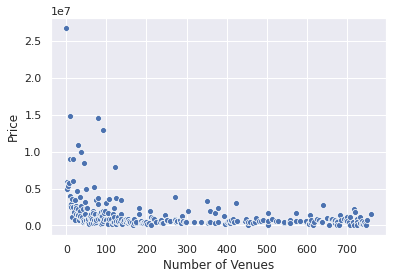

In [58]:
p = sns.scatterplot('Number of Venues', 'Price', data=df)
#p.savefigure('hp.png')

Clustering

In [59]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

print('Libraries imported.')

Libraries imported.


Run K means clustering with 5 clusters

In [60]:
# set number of clusters
kclusters = 3

hs_clustering = hs.drop(['AreaName'], 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(hs_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [61]:
hs_clustering['labels'] = kmeans.labels_

In [62]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(hs['lat'], hs['lng'], hs['AreaName'], hs_clustering['labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [63]:
hs_clustering[hs_clustering['labels'] == 0].describe()

,Price ($),lat,lng,Bakery,Coffee Shop,Breakfast Spot,Yoga Studio,Pub,Spa,Thai Restaurant,Event Space,Restaurant,Italian Restaurant,Distribution Center,Gym / Fitness Center,Food Truck,Theater,Electronics Store,Beer Store,Health Food Store,Dance Studio,Park,Sushi Restaurant,Beer Bar,Bubble Tea Shop,Mexican Restaurant,Creperie,Diner,Ramen Restaurant,General Entertainment,Arts & Crafts Store,Burrito Place,Hobby Shop,Café,Martial Arts Dojo,Indian Restaurant,College Theater,Poke Place,Deli / Bodega,Gym,College Cafeteria,Vegetarian / Vegan Restaurant,Music Venue,Tea Room,Clothing Store,Comic Shop,Plaza,Pizza Place,College Rec Center,Sandwich Place,Hotel,Sporting Goods Shop,Art Gallery,Steakhouse,Japanese Restaurant,Shopping Mall,Burger Joint,Tanning Salon,Fast Food Restaurant,Lounge,Middle Eastern Restaurant,Cosmetics Shop,Lake,Bookstore,Modern European Restaurant,Miscellaneous Shop,Gastropub,New American Restaurant,Ethiopian Restaurant,Furniture / Home Store,Bank,Seafood Restaurant,Poutine Place,Chinese Restaurant,Other Great Outdoors,Hookah Bar,Bar,Dessert Shop,Department Store,Lingerie Store,Movie Theater,Shoe Store,Smoke Shop,Vietnamese Restaurant,Wine Bar,Video Game Store,Greek Restaurant,Church,American Restaurant,BBQ Joint,Ice Cream Shop,Cocktail Bar,Farmers Market,Fountain,Camera Store,Tailor Shop,Grocery Store,French Restaurant,Fish Market,Comfort Food Restaurant,Salon / Barbershop,Irish Pub,Asian Restaurant,Bistro,Pharmacy,Moroccan Restaurant,Belgian Restaurant,Trail,Neighborhood,Cheese Shop,Museum,Concert Hall,Basketball Stadium,Liquor Store,Jazz Club,Molecular Gastronomy Restaurant,Gourmet Shop,Bagel Shop,Hotel Bar,Eastern European Restaurant,Juice Bar,Sports Bar,Soup Place,Art Museum,Discount Store,Donut Shop,Playground,Candy Store,Baby Store,Speakeasy,Gluten-free Restaurant,General Travel,Opera House,Food Court,Monument / Landmark,Salad Place,Colombian Restaurant,Mediterranean Restaurant,Garden,Taco Place,Brazilian Restaurant,Building,Women's Store,Latin American Restaurant,Bus Line,Athletics & Sports,Harbor / Marina,Brewery,Korean Restaurant,Cuban Restaurant,Record Shop,Malay Restaurant,Cupcake Shop,Mac & Cheese Joint,Men's Store,Dog Run,Gift Shop,Music Store,Fruit & Vegetable Store,Train Station,IT Services,Roof Deck,Supermarket,Hawaiian Restaurant,Pet Store,Thrift / Vintage Store,Beach Bar,Chiropractor,Accessories Store,Boutique,Fish & Chips Shop,Board Shop,Food & Drink Shop,Coworking Space,Baseball Field,Performing Arts Venue,Garden Center,Photography Studio,Home Service,Bed & Breakfast,Residential Building (Apartment / Condo),Gym Pool,History Museum,Butcher,Flower Shop,Curling Ice,Optical Shop,Toy / Game Store,Gas Station,Tennis Court,College Gym,College Arts Building,Noodle House,Falafel Restaurant,Smoothie Shop,Indie Movie Theater,Post Office,Pilates Studio,Organic Grocery,Caribbean Restaurant,Gaming Cafe,Doner Restaurant,Light Rail Station,Market,Historic Site,Wings Joint,Fried Chicken Joint,Whisky Bar,Jewelry Store,Taiwanese Restaurant,Library,Convenience Store,Snack Place,Office,Theme Restaurant,Wine Shop,Gay Bar,Sake Bar,Afghan Restaurant,Strip Club,Sculpture Garden,Total Number of Venues,labels
count,4.704000e+03,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.0

In [64]:
hs_clustering[hs_clustering['labels'] == 1].describe()

,Price ($),lat,lng,Bakery,Coffee Shop,Breakfast Spot,Yoga Studio,Pub,Spa,Thai Restaurant,Event Space,Restaurant,Italian Restaurant,Distribution Center,Gym / Fitness Center,Food Truck,Theater,Electronics Store,Beer Store,Health Food Store,Dance Studio,Park,Sushi Restaurant,Beer Bar,Bubble Tea Shop,Mexican Restaurant,Creperie,Diner,Ramen Restaurant,General Entertainment,Arts & Crafts Store,Burrito Place,Hobby Shop,Café,Martial Arts Dojo,Indian Restaurant,College Theater,Poke Place,Deli / Bodega,Gym,College Cafeteria,Vegetarian / Vegan Restaurant,Music Venue,Tea Room,Clothing Store,Comic Shop,Plaza,Pizza Place,College Rec Center,Sandwich Place,Hotel,Sporting Goods Shop,Art Gallery,Steakhouse,Japanese Restaurant,Shopping Mall,Burger Joint,Tanning Salon,Fast Food Restaurant,Lounge,Middle Eastern Restaurant,Cosmetics Shop,Lake,Bookstore,Modern European Restaurant,Miscellaneous Shop,Gastropub,New American Restaurant,Ethiopian Restaurant,Furniture / Home Store,Bank,Seafood Restaurant,Poutine Place,Chinese Restaurant,Other Great Outdoors,Hookah Bar,Bar,Dessert Shop,Department Store,Lingerie Store,Movie Theater,Shoe Store,Smoke Shop,Vietnamese Restaurant,Wine Bar,Video Game Store,Greek Restaurant,Church,American Restaurant,BBQ Joint,Ice Cream Shop,Cocktail Bar,Farmers Market,Fountain,Camera Store,Tailor Shop,Grocery Store,French Restaurant,Fish Market,Comfort Food Restaurant,Salon / Barbershop,Irish Pub,Asian Restaurant,Bistro,Pharmacy,Moroccan Restaurant,Belgian Restaurant,Trail,Neighborhood,Cheese Shop,Museum,Concert Hall,Basketball Stadium,Liquor Store,Jazz Club,Molecular Gastronomy Restaurant,Gourmet Shop,Bagel Shop,Hotel Bar,Eastern European Restaurant,Juice Bar,Sports Bar,Soup Place,Art Museum,Discount Store,Donut Shop,Playground,Candy Store,Baby Store,Speakeasy,Gluten-free Restaurant,General Travel,Opera House,Food Court,Monument / Landmark,Salad Place,Colombian Restaurant,Mediterranean Restaurant,Garden,Taco Place,Brazilian Restaurant,Building,Women's Store,Latin American Restaurant,Bus Line,Athletics & Sports,Harbor / Marina,Brewery,Korean Restaurant,Cuban Restaurant,Record Shop,Malay Restaurant,Cupcake Shop,Mac & Cheese Joint,Men's Store,Dog Run,Gift Shop,Music Store,Fruit & Vegetable Store,Train Station,IT Services,Roof Deck,Supermarket,Hawaiian Restaurant,Pet Store,Thrift / Vintage Store,Beach Bar,Chiropractor,Accessories Store,Boutique,Fish & Chips Shop,Board Shop,Food & Drink Shop,Coworking Space,Baseball Field,Performing Arts Venue,Garden Center,Photography Studio,Home Service,Bed & Breakfast,Residential Building (Apartment / Condo),Gym Pool,History Museum,Butcher,Flower Shop,Curling Ice,Optical Shop,Toy / Game Store,Gas Station,Tennis Court,College Gym,College Arts Building,Noodle House,Falafel Restaurant,Smoothie Shop,Indie Movie Theater,Post Office,Pilates Studio,Organic Grocery,Caribbean Restaurant,Gaming Cafe,Doner Restaurant,Light Rail Station,Market,Historic Site,Wings Joint,Fried Chicken Joint,Whisky Bar,Jewelry Store,Taiwanese Restaurant,Library,Convenience Store,Snack Place,Office,Theme Restaurant,Wine Shop,Gay Bar,Sake Bar,Afghan Restaurant,Strip Club,Sculpture Garden,Total Number of Venues,labels
count,2.700000e+01,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.0,27.000000,27.0,27.000000,27.000000,27.000000,27.0,27.000000,27.000000,27.0,27.000000,27.0,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.0,27.000000,27.0,27.0,27.000000,27.000000,27.000000,27.000000,27.0,27.0,27.000000,27.0,27.0,27.000000,27.0,27.000000,27.0,27.000000,27.0,27.0,27.000000,27.0,27.0,27.000000,27.0,27.0,27.000000,27.000000,27.0,27.0,27.000000,27.0,27.0,27.000000,27.000000,27.0,27.0,27.000000,27.0,27.000000,27.0,27.0,27.000000,27.0,27.0,27.000000,27.000000,27.000000,27.0,27.0,27.0,27.0,27.0,27.000000,27.000000,27.000000,27.000000,

In [65]:
hs_clustering[hs_clustering['labels'] == 2].describe()

,Price ($),lat,lng,Bakery,Coffee Shop,Breakfast Spot,Yoga Studio,Pub,Spa,Thai Restaurant,Event Space,Restaurant,Italian Restaurant,Distribution Center,Gym / Fitness Center,Food Truck,Theater,Electronics Store,Beer Store,Health Food Store,Dance Studio,Park,Sushi Restaurant,Beer Bar,Bubble Tea Shop,Mexican Restaurant,Creperie,Diner,Ramen Restaurant,General Entertainment,Arts & Crafts Store,Burrito Place,Hobby Shop,Café,Martial Arts Dojo,Indian Restaurant,College Theater,Poke Place,Deli / Bodega,Gym,College Cafeteria,Vegetarian / Vegan Restaurant,Music Venue,Tea Room,Clothing Store,Comic Shop,Plaza,Pizza Place,College Rec Center,Sandwich Place,Hotel,Sporting Goods Shop,Art Gallery,Steakhouse,Japanese Restaurant,Shopping Mall,Burger Joint,Tanning Salon,Fast Food Restaurant,Lounge,Middle Eastern Restaurant,Cosmetics Shop,Lake,Bookstore,Modern European Restaurant,Miscellaneous Shop,Gastropub,New American Restaurant,Ethiopian Restaurant,Furniture / Home Store,Bank,Seafood Restaurant,Poutine Place,Chinese Restaurant,Other Great Outdoors,Hookah Bar,Bar,Dessert Shop,Department Store,Lingerie Store,Movie Theater,Shoe Store,Smoke Shop,Vietnamese Restaurant,Wine Bar,Video Game Store,Greek Restaurant,Church,American Restaurant,BBQ Joint,Ice Cream Shop,Cocktail Bar,Farmers Market,Fountain,Camera Store,Tailor Shop,Grocery Store,French Restaurant,Fish Market,Comfort Food Restaurant,Salon / Barbershop,Irish Pub,Asian Restaurant,Bistro,Pharmacy,Moroccan Restaurant,Belgian Restaurant,Trail,Neighborhood,Cheese Shop,Museum,Concert Hall,Basketball Stadium,Liquor Store,Jazz Club,Molecular Gastronomy Restaurant,Gourmet Shop,Bagel Shop,Hotel Bar,Eastern European Restaurant,Juice Bar,Sports Bar,Soup Place,Art Museum,Discount Store,Donut Shop,Playground,Candy Store,Baby Store,Speakeasy,Gluten-free Restaurant,General Travel,Opera House,Food Court,Monument / Landmark,Salad Place,Colombian Restaurant,Mediterranean Restaurant,Garden,Taco Place,Brazilian Restaurant,Building,Women's Store,Latin American Restaurant,Bus Line,Athletics & Sports,Harbor / Marina,Brewery,Korean Restaurant,Cuban Restaurant,Record Shop,Malay Restaurant,Cupcake Shop,Mac & Cheese Joint,Men's Store,Dog Run,Gift Shop,Music Store,Fruit & Vegetable Store,Train Station,IT Services,Roof Deck,Supermarket,Hawaiian Restaurant,Pet Store,Thrift / Vintage Store,Beach Bar,Chiropractor,Accessories Store,Boutique,Fish & Chips Shop,Board Shop,Food & Drink Shop,Coworking Space,Baseball Field,Performing Arts Venue,Garden Center,Photography Studio,Home Service,Bed & Breakfast,Residential Building (Apartment / Condo),Gym Pool,History Museum,Butcher,Flower Shop,Curling Ice,Optical Shop,Toy / Game Store,Gas Station,Tennis Court,College Gym,College Arts Building,Noodle House,Falafel Restaurant,Smoothie Shop,Indie Movie Theater,Post Office,Pilates Studio,Organic Grocery,Caribbean Restaurant,Gaming Cafe,Doner Restaurant,Light Rail Station,Market,Historic Site,Wings Joint,Fried Chicken Joint,Whisky Bar,Jewelry Store,Taiwanese Restaurant,Library,Convenience Store,Snack Place,Office,Theme Restaurant,Wine Shop,Gay Bar,Sake Bar,Afghan Restaurant,Strip Club,Sculpture Garden,Total Number of Venues,labels
count,3.610000e+02,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000

In [66]:
hs_clustering[hs_clustering['labels'] == 3].describe()

,Price ($),lat,lng,Bakery,Coffee Shop,Breakfast Spot,Yoga Studio,Pub,Spa,Thai Restaurant,Event Space,Restaurant,Italian Restaurant,Distribution Center,Gym / Fitness Center,Food Truck,Theater,Electronics Store,Beer Store,Health Food Store,Dance Studio,Park,Sushi Restaurant,Beer Bar,Bubble Tea Shop,Mexican Restaurant,Creperie,Diner,Ramen Restaurant,General Entertainment,Arts & Crafts Store,Burrito Place,Hobby Shop,Café,Martial Arts Dojo,Indian Restaurant,College Theater,Poke Place,Deli / Bodega,Gym,College Cafeteria,Vegetarian / Vegan Restaurant,Music Venue,Tea Room,Clothing Store,Comic Shop,Plaza,Pizza Place,College Rec Center,Sandwich Place,Hotel,Sporting Goods Shop,Art Gallery,Steakhouse,Japanese Restaurant,Shopping Mall,Burger Joint,Tanning Salon,Fast Food Restaurant,Lounge,Middle Eastern Restaurant,Cosmetics Shop,Lake,Bookstore,Modern European Restaurant,Miscellaneous Shop,Gastropub,New American Restaurant,Ethiopian Restaurant,Furniture / Home Store,Bank,Seafood Restaurant,Poutine Place,Chinese Restaurant,Other Great Outdoors,Hookah Bar,Bar,Dessert Shop,Department Store,Lingerie Store,Movie Theater,Shoe Store,Smoke Shop,Vietnamese Restaurant,Wine Bar,Video Game Store,Greek Restaurant,Church,American Restaurant,BBQ Joint,Ice Cream Shop,Cocktail Bar,Farmers Market,Fountain,Camera Store,Tailor Shop,Grocery Store,French Restaurant,Fish Market,Comfort Food Restaurant,Salon / Barbershop,Irish Pub,Asian Restaurant,Bistro,Pharmacy,Moroccan Restaurant,Belgian Restaurant,Trail,Neighborhood,Cheese Shop,Museum,Concert Hall,Basketball Stadium,Liquor Store,Jazz Club,Molecular Gastronomy Restaurant,Gourmet Shop,Bagel Shop,Hotel Bar,Eastern European Restaurant,Juice Bar,Sports Bar,Soup Place,Art Museum,Discount Store,Donut Shop,Playground,Candy Store,Baby Store,Speakeasy,Gluten-free Restaurant,General Travel,Opera House,Food Court,Monument / Landmark,Salad Place,Colombian Restaurant,Mediterranean Restaurant,Garden,Taco Place,Brazilian Restaurant,Building,Women's Store,Latin American Restaurant,Bus Line,Athletics & Sports,Harbor / Marina,Brewery,Korean Restaurant,Cuban Restaurant,Record Shop,Malay Restaurant,Cupcake Shop,Mac & Cheese Joint,Men's Store,Dog Run,Gift Shop,Music Store,Fruit & Vegetable Store,Train Station,IT Services,Roof Deck,Supermarket,Hawaiian Restaurant,Pet Store,Thrift / Vintage Store,Beach Bar,Chiropractor,Accessories Store,Boutique,Fish & Chips Shop,Board Shop,Food & Drink Shop,Coworking Space,Baseball Field,Performing Arts Venue,Garden Center,Photography Studio,Home Service,Bed & Breakfast,Residential Building (Apartment / Condo),Gym Pool,History Museum,Butcher,Flower Shop,Curling Ice,Optical Shop,Toy / Game Store,Gas Station,Tennis Court,College Gym,College Arts Building,Noodle House,Falafel Restaurant,Smoothie Shop,Indie Movie Theater,Post Office,Pilates Studio,Organic Grocery,Caribbean Restaurant,Gaming Cafe,Doner Restaurant,Light Rail Station,Market,Historic Site,Wings Joint,Fried Chicken Joint,Whisky Bar,Jewelry Store,Taiwanese Restaurant,Library,Convenience Store,Snack Place,Office,Theme Restaurant,Wine Shop,Gay Bar,Sake Bar,Afghan Restaurant,Strip Club,Sculpture Garden,Total Number of Venues,labels
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [67]:
hs_clustering[hs_clustering['labels'] == 4].describe()

,Price ($),lat,lng,Bakery,Coffee Shop,Breakfast Spot,Yoga Studio,Pub,Spa,Thai Restaurant,Event Space,Restaurant,Italian Restaurant,Distribution Center,Gym / Fitness Center,Food Truck,Theater,Electronics Store,Beer Store,Health Food Store,Dance Studio,Park,Sushi Restaurant,Beer Bar,Bubble Tea Shop,Mexican Restaurant,Creperie,Diner,Ramen Restaurant,General Entertainment,Arts & Crafts Store,Burrito Place,Hobby Shop,Café,Martial Arts Dojo,Indian Restaurant,College Theater,Poke Place,Deli / Bodega,Gym,College Cafeteria,Vegetarian / Vegan Restaurant,Music Venue,Tea Room,Clothing Store,Comic Shop,Plaza,Pizza Place,College Rec Center,Sandwich Place,Hotel,Sporting Goods Shop,Art Gallery,Steakhouse,Japanese Restaurant,Shopping Mall,Burger Joint,Tanning Salon,Fast Food Restaurant,Lounge,Middle Eastern Restaurant,Cosmetics Shop,Lake,Bookstore,Modern European Restaurant,Miscellaneous Shop,Gastropub,New American Restaurant,Ethiopian Restaurant,Furniture / Home Store,Bank,Seafood Restaurant,Poutine Place,Chinese Restaurant,Other Great Outdoors,Hookah Bar,Bar,Dessert Shop,Department Store,Lingerie Store,Movie Theater,Shoe Store,Smoke Shop,Vietnamese Restaurant,Wine Bar,Video Game Store,Greek Restaurant,Church,American Restaurant,BBQ Joint,Ice Cream Shop,Cocktail Bar,Farmers Market,Fountain,Camera Store,Tailor Shop,Grocery Store,French Restaurant,Fish Market,Comfort Food Restaurant,Salon / Barbershop,Irish Pub,Asian Restaurant,Bistro,Pharmacy,Moroccan Restaurant,Belgian Restaurant,Trail,Neighborhood,Cheese Shop,Museum,Concert Hall,Basketball Stadium,Liquor Store,Jazz Club,Molecular Gastronomy Restaurant,Gourmet Shop,Bagel Shop,Hotel Bar,Eastern European Restaurant,Juice Bar,Sports Bar,Soup Place,Art Museum,Discount Store,Donut Shop,Playground,Candy Store,Baby Store,Speakeasy,Gluten-free Restaurant,General Travel,Opera House,Food Court,Monument / Landmark,Salad Place,Colombian Restaurant,Mediterranean Restaurant,Garden,Taco Place,Brazilian Restaurant,Building,Women's Store,Latin American Restaurant,Bus Line,Athletics & Sports,Harbor / Marina,Brewery,Korean Restaurant,Cuban Restaurant,Record Shop,Malay Restaurant,Cupcake Shop,Mac & Cheese Joint,Men's Store,Dog Run,Gift Shop,Music Store,Fruit & Vegetable Store,Train Station,IT Services,Roof Deck,Supermarket,Hawaiian Restaurant,Pet Store,Thrift / Vintage Store,Beach Bar,Chiropractor,Accessories Store,Boutique,Fish & Chips Shop,Board Shop,Food & Drink Shop,Coworking Space,Baseball Field,Performing Arts Venue,Garden Center,Photography Studio,Home Service,Bed & Breakfast,Residential Building (Apartment / Condo),Gym Pool,History Museum,Butcher,Flower Shop,Curling Ice,Optical Shop,Toy / Game Store,Gas Station,Tennis Court,College Gym,College Arts Building,Noodle House,Falafel Restaurant,Smoothie Shop,Indie Movie Theater,Post Office,Pilates Studio,Organic Grocery,Caribbean Restaurant,Gaming Cafe,Doner Restaurant,Light Rail Station,Market,Historic Site,Wings Joint,Fried Chicken Joint,Whisky Bar,Jewelry Store,Taiwanese Restaurant,Library,Convenience Store,Snack Place,Office,Theme Restaurant,Wine Shop,Gay Bar,Sake Bar,Afghan Restaurant,Strip Club,Sculpture Garden,Total Number of Venues,labels
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [68]:
hs_clustering[hs_clustering['labels'] == 5].describe()

,Price ($),lat,lng,Bakery,Coffee Shop,Breakfast Spot,Yoga Studio,Pub,Spa,Thai Restaurant,Event Space,Restaurant,Italian Restaurant,Distribution Center,Gym / Fitness Center,Food Truck,Theater,Electronics Store,Beer Store,Health Food Store,Dance Studio,Park,Sushi Restaurant,Beer Bar,Bubble Tea Shop,Mexican Restaurant,Creperie,Diner,Ramen Restaurant,General Entertainment,Arts & Crafts Store,Burrito Place,Hobby Shop,Café,Martial Arts Dojo,Indian Restaurant,College Theater,Poke Place,Deli / Bodega,Gym,College Cafeteria,Vegetarian / Vegan Restaurant,Music Venue,Tea Room,Clothing Store,Comic Shop,Plaza,Pizza Place,College Rec Center,Sandwich Place,Hotel,Sporting Goods Shop,Art Gallery,Steakhouse,Japanese Restaurant,Shopping Mall,Burger Joint,Tanning Salon,Fast Food Restaurant,Lounge,Middle Eastern Restaurant,Cosmetics Shop,Lake,Bookstore,Modern European Restaurant,Miscellaneous Shop,Gastropub,New American Restaurant,Ethiopian Restaurant,Furniture / Home Store,Bank,Seafood Restaurant,Poutine Place,Chinese Restaurant,Other Great Outdoors,Hookah Bar,Bar,Dessert Shop,Department Store,Lingerie Store,Movie Theater,Shoe Store,Smoke Shop,Vietnamese Restaurant,Wine Bar,Video Game Store,Greek Restaurant,Church,American Restaurant,BBQ Joint,Ice Cream Shop,Cocktail Bar,Farmers Market,Fountain,Camera Store,Tailor Shop,Grocery Store,French Restaurant,Fish Market,Comfort Food Restaurant,Salon / Barbershop,Irish Pub,Asian Restaurant,Bistro,Pharmacy,Moroccan Restaurant,Belgian Restaurant,Trail,Neighborhood,Cheese Shop,Museum,Concert Hall,Basketball Stadium,Liquor Store,Jazz Club,Molecular Gastronomy Restaurant,Gourmet Shop,Bagel Shop,Hotel Bar,Eastern European Restaurant,Juice Bar,Sports Bar,Soup Place,Art Museum,Discount Store,Donut Shop,Playground,Candy Store,Baby Store,Speakeasy,Gluten-free Restaurant,General Travel,Opera House,Food Court,Monument / Landmark,Salad Place,Colombian Restaurant,Mediterranean Restaurant,Garden,Taco Place,Brazilian Restaurant,Building,Women's Store,Latin American Restaurant,Bus Line,Athletics & Sports,Harbor / Marina,Brewery,Korean Restaurant,Cuban Restaurant,Record Shop,Malay Restaurant,Cupcake Shop,Mac & Cheese Joint,Men's Store,Dog Run,Gift Shop,Music Store,Fruit & Vegetable Store,Train Station,IT Services,Roof Deck,Supermarket,Hawaiian Restaurant,Pet Store,Thrift / Vintage Store,Beach Bar,Chiropractor,Accessories Store,Boutique,Fish & Chips Shop,Board Shop,Food & Drink Shop,Coworking Space,Baseball Field,Performing Arts Venue,Garden Center,Photography Studio,Home Service,Bed & Breakfast,Residential Building (Apartment / Condo),Gym Pool,History Museum,Butcher,Flower Shop,Curling Ice,Optical Shop,Toy / Game Store,Gas Station,Tennis Court,College Gym,College Arts Building,Noodle House,Falafel Restaurant,Smoothie Shop,Indie Movie Theater,Post Office,Pilates Studio,Organic Grocery,Caribbean Restaurant,Gaming Cafe,Doner Restaurant,Light Rail Station,Market,Historic Site,Wings Joint,Fried Chicken Joint,Whisky Bar,Jewelry Store,Taiwanese Restaurant,Library,Convenience Store,Snack Place,Office,Theme Restaurant,Wine Shop,Gay Bar,Sake Bar,Afghan Restaurant,Strip Club,Sculpture Garden,Total Number of Venues,labels
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [69]:
hs1 = hs_clustering[hs_clustering['labels']==0]
hs2 = hs_clustering[hs_clustering['labels']==1]
hs3 = hs_clustering[hs_clustering['labels']==2]

In [70]:
x = np.array(hs1['Total Number of Venues'])
y = np.array(hs1['Price ($)'])

In [71]:
from matplotlib import pyplot as plt

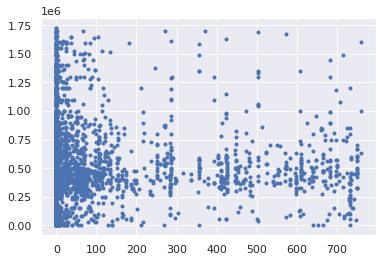

In [72]:
plt.plot(x,y, '.')

In [73]:
def plot1(df):
    
    x = np.array(df['Total Number of Venues'])
    y = np.array(df['Price ($)'])
    plt.plot(x,y, '.')
    plt.xlabel('Total Number of Venues')
    plt.ylabel('Price ($)')

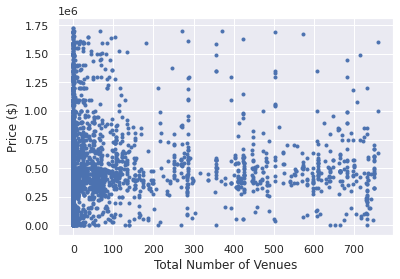

In [75]:
plot1(hs1)
plt.savefig('hs1.png')

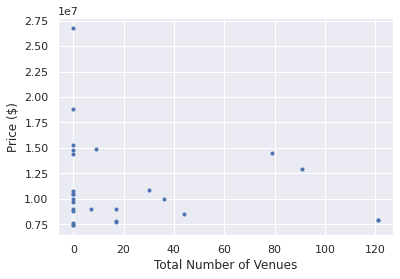

In [76]:
plot1(hs2)
plt.savefig('hs2.png')

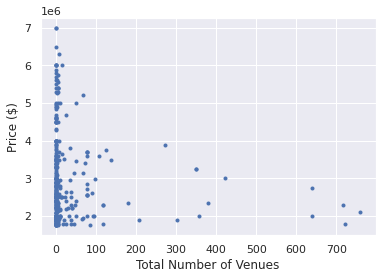

In [77]:
plot1(hs3)
plt.savefig('hs3.png')

In [78]:
hs1.describe()

,Price ($),lat,lng,Bakery,Coffee Shop,Breakfast Spot,Yoga Studio,Pub,Spa,Thai Restaurant,Event Space,Restaurant,Italian Restaurant,Distribution Center,Gym / Fitness Center,Food Truck,Theater,Electronics Store,Beer Store,Health Food Store,Dance Studio,Park,Sushi Restaurant,Beer Bar,Bubble Tea Shop,Mexican Restaurant,Creperie,Diner,Ramen Restaurant,General Entertainment,Arts & Crafts Store,Burrito Place,Hobby Shop,Café,Martial Arts Dojo,Indian Restaurant,College Theater,Poke Place,Deli / Bodega,Gym,College Cafeteria,Vegetarian / Vegan Restaurant,Music Venue,Tea Room,Clothing Store,Comic Shop,Plaza,Pizza Place,College Rec Center,Sandwich Place,Hotel,Sporting Goods Shop,Art Gallery,Steakhouse,Japanese Restaurant,Shopping Mall,Burger Joint,Tanning Salon,Fast Food Restaurant,Lounge,Middle Eastern Restaurant,Cosmetics Shop,Lake,Bookstore,Modern European Restaurant,Miscellaneous Shop,Gastropub,New American Restaurant,Ethiopian Restaurant,Furniture / Home Store,Bank,Seafood Restaurant,Poutine Place,Chinese Restaurant,Other Great Outdoors,Hookah Bar,Bar,Dessert Shop,Department Store,Lingerie Store,Movie Theater,Shoe Store,Smoke Shop,Vietnamese Restaurant,Wine Bar,Video Game Store,Greek Restaurant,Church,American Restaurant,BBQ Joint,Ice Cream Shop,Cocktail Bar,Farmers Market,Fountain,Camera Store,Tailor Shop,Grocery Store,French Restaurant,Fish Market,Comfort Food Restaurant,Salon / Barbershop,Irish Pub,Asian Restaurant,Bistro,Pharmacy,Moroccan Restaurant,Belgian Restaurant,Trail,Neighborhood,Cheese Shop,Museum,Concert Hall,Basketball Stadium,Liquor Store,Jazz Club,Molecular Gastronomy Restaurant,Gourmet Shop,Bagel Shop,Hotel Bar,Eastern European Restaurant,Juice Bar,Sports Bar,Soup Place,Art Museum,Discount Store,Donut Shop,Playground,Candy Store,Baby Store,Speakeasy,Gluten-free Restaurant,General Travel,Opera House,Food Court,Monument / Landmark,Salad Place,Colombian Restaurant,Mediterranean Restaurant,Garden,Taco Place,Brazilian Restaurant,Building,Women's Store,Latin American Restaurant,Bus Line,Athletics & Sports,Harbor / Marina,Brewery,Korean Restaurant,Cuban Restaurant,Record Shop,Malay Restaurant,Cupcake Shop,Mac & Cheese Joint,Men's Store,Dog Run,Gift Shop,Music Store,Fruit & Vegetable Store,Train Station,IT Services,Roof Deck,Supermarket,Hawaiian Restaurant,Pet Store,Thrift / Vintage Store,Beach Bar,Chiropractor,Accessories Store,Boutique,Fish & Chips Shop,Board Shop,Food & Drink Shop,Coworking Space,Baseball Field,Performing Arts Venue,Garden Center,Photography Studio,Home Service,Bed & Breakfast,Residential Building (Apartment / Condo),Gym Pool,History Museum,Butcher,Flower Shop,Curling Ice,Optical Shop,Toy / Game Store,Gas Station,Tennis Court,College Gym,College Arts Building,Noodle House,Falafel Restaurant,Smoothie Shop,Indie Movie Theater,Post Office,Pilates Studio,Organic Grocery,Caribbean Restaurant,Gaming Cafe,Doner Restaurant,Light Rail Station,Market,Historic Site,Wings Joint,Fried Chicken Joint,Whisky Bar,Jewelry Store,Taiwanese Restaurant,Library,Convenience Store,Snack Place,Office,Theme Restaurant,Wine Shop,Gay Bar,Sake Bar,Afghan Restaurant,Strip Club,Sculpture Garden,Total Number of Venues,labels
count,4.704000e+03,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.000000,4704.0

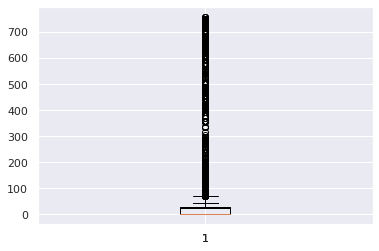

In [80]:
plt.boxplot(hs1['Total Number of Venues'])
plt.boxplot(hs2['Total Number of Venues'])
plt.boxplot(hs2['Total Number of Venues'])
plt.show()

In [81]:
#sns.set(style="ticks", palette="pastel")

In [99]:
c1 = list(hs1['Total Number of Venues'])
c2 = list(hs2['Total Number of Venues'])
c3 = list(hs3['Total Number of Venues'])

In [91]:
d = len(c1) - len(c2)

for i in range(d):
    
    c2.append(None)

d = len(c1) - len(c3)

for i in range(d):
    
    c3.append(None)

In [93]:
cdf = pd.DataFrame({'cluster 1':c1, 'cluster 2':c2, 'cluster 3':c3})

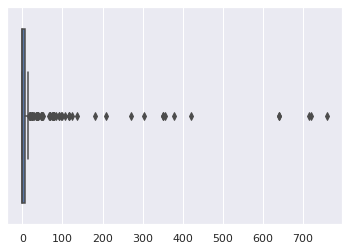

In [97]:
sns.boxplot(c3)

/home/edison/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


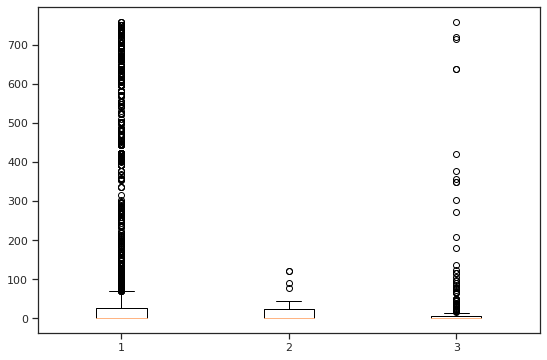

/home/edison/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


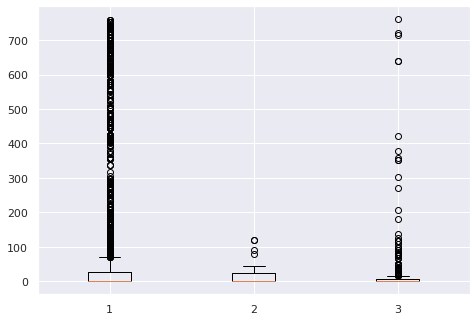

<Figure size 432x288 with 0 Axes>

In [101]:
fig = plt.figure()
# Create an axes instance
ax = fig.add_axes([0,0,1,1])
# Create the boxplot
bp = ax.boxplot([c1,c2,c3])
plt.show()
plt.savefig('bp.png')

/home/edison/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  import sys


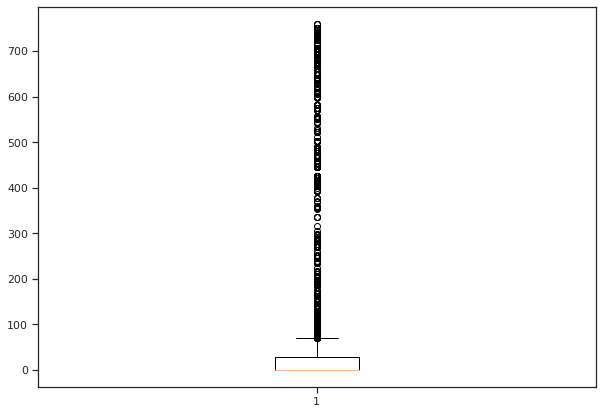

In [141]:
fig = plt.figure(figsize =(10, 7)) 
  
# Creating plot 
plt.boxplot(c1) 
  
# show plot 
plt.show() 

In [102]:
means = [hs1['Total Number of Venues'].mean(), hs2['Total Number of Venues'].mean(), hs3['Total Number of Venues'].mean()]



In [170]:
up = [hs1['Total Number of Venues'].mean(), hs2['Total Number of Venues'].mean()+24, hs3['Total Number of Venues'].min()+32]

In [171]:
low = [hs1['Total Number of Venues'].min(), hs2['Total Number of Venues'].min(), hs3['Total Number of Venues'].min()]

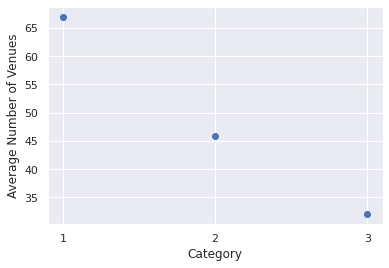

In [173]:
plt.plot([1,2,3], up, 'o')
plt.xlabel('Category')
plt.ylabel('Average Number of Venues')
plt.xticks([1,2,3])
plt.savefig('avg.png')

In [174]:
def lin(x, m, b):
    return m*x + b

In [179]:
from scipy.optimize import curve_fit

In [181]:
popt, pcov = curve_fit(lin, [1,2,3], up)

In [182]:
popt

array([-17.49457908,  83.25714916])